In [ ]:
# To dos
# * split dataset for cross validation
# * interpolation methods
# * smooth masks
# * why viable and whole totals are the same
#
#
#

In [5]:
TRAINSET_PATH = 'D:\work2019-2020\PAIP_2019\data\TrainingData\*zip'
LIVER_IMAGES_TEMP_PATH = 'D:\work2019-2020\PAIP_2019\data\TempLiverImages'

########################
# PREPROCESSING HYPERP #
########################

patch_size = 256
stride_size = 250  # distance to skip between patches
resize = 1  # resize input images
test_set_size = .2


data_name = "paip2019"
classes = [0,1]
stages = {"train", "val"}

In [6]:
import torch
import tables

import os,sys
import gc
import glob
import zipfile

import PIL
import numpy as np

import matplotlib.pyplot as plt

from sklearn import model_selection
import sklearn.feature_extraction.image
import random
from pydaily import filesystem
import cv2
from skimage import io, transform
from scipy import misc
from skimage.color import gray2rgb
import sklearn.feature_extraction.image
import openslide
from openslide import OpenSlide, OpenSlideUnsupportedFormatError, OpenSlideError

# set up random seed for reproducing results on validation set
seed = 10
random.seed(seed)

In [22]:
####################
# Helper functions #
####################

def unzip_file(zip_file_path, unzip_temp_dir=LIVER_IMAGES_TEMP_PATH):
    """
        Unzips file from specified location to a temporary location
        Args:
            zip_file_path: path of the zip file to be decompressed
    """
    filesystem.overwrite_dir(unzip_temp_dir) # overwrite directory
    zip_ref = zipfile.ZipFile(zip_file_path, 'r')
    zip_ref.extractall(unzip_temp_dir)
    zip_ref.close()


def load_mask(mask_path):
    """
        Function for loading liver masks (.tiff file).
        Args:
            mask_path (string): file path for mask images
        Returns:
            img_array (ndarray)
    """
    assert(os.path.isfile(mask_path))
    mask = io.imread(mask_path)
    #print('mask shape:', mask.shape)
    return mask

def load_slide(wsi_path):
    """
        Open a whole-slide image (*.svs file)        
        Args:
            wsi_path (string): file path for the wsi file            
        Returns:
            OpenSlide object
    """    
    try:
        slide = OpenSlide(wsi_path)
    except OpenSlideError:
        slide = None
    except FileNotFoundError:
        slide = None
    return slide

def get_sample_index(fname):
    """
        Function to return the name of a sample file.
        Args:
            filename (string): file path
        Returns:
            name of the file (string)            
    """
    return os.path.basename(fname)[-7:-4]


def sample_info(file_idx, wsi, viable_mask, whole_mask):
    """
        Print information about one single data sample.
    """
    
    print(f'Info for sample data #{file_idx}/50')
    print("WSI info:")
    print(f'  Level count: {wsi.level_count}')
    print(f'  Level dimensions: {wsi.level_dimensions}')
    print(f'  Level downsamples: {wsi.level_downsamples}')
    print(f'  Dimensions: {wsi.dimensions}')
    objective_power = int(wsi.properties[openslide.PROPERTY_NAME_OBJECTIVE_POWER])
    print(f'Objective power: {objective_power}')
    print("Masks info:")
    print(f'  Dimensions: {viable_mask.shape}')

def load_images(wsi_path, viable_path, whole_path):
    """
        Function to load one sample of data (wsi, viable_masl, whole_mask)
    """
    wsi = load_slide(wsi_path)
    viable_mask = load_mask(viable_path)
    whole_mask = load_mask(whole_path)
    
    return wsi, viable_mask, whole_mask
    
    
def resize_images(wsi, viable_mask, whole_mask, display_level=2): 
    """
        Function to resize the wsi to level 2 and masks according to the slide's new_size.
        Args:
            wsi (OpenSlide object): the whole slide image
            viable_mask (ndarray): the viable mask
            whole_mask (ndarray): the whole mask
        Returns:
            wsi (ndarray): resized whole slide image
            viable_mask (ndarray): resized viable mask
            whole_mask (ndarray): resized whole mask
    """
    new_size = (wsi.level_dimensions[display_level][0], wsi.level_dimensions[display_level][1]) 
    wsi = np.asarray(wsi.read_region((0, 0), display_level, wsi.level_dimensions[display_level]))[:,:,:3]
    print(wsi.shape)
    viable_mask = cv2.resize(viable_mask, new_size)   
    whole_mask = cv2.resize(whole_mask, new_size)
    
    return wsi, viable_mask, whole_mask

def visualize_sample(idx, wsi, viable_mask, whole_mask):
    """
        Function to visualize one data sample.
        Saves images to ./data/LiverImages. 
        Args:
            stage (string): either "train" or "val"
            idx (int): the number of the data sample
            wsi (ndarray): the whole slide image
            viable_mask (ndarray): the viable mask
            whole_mask (ndarray): the whole mask
            
    """
    fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(16, 5))    
    ax1.imshow(wsi)
    ax1.set_title('Slide Image')    
    ax3.imshow(viable_mask)
    ax3.set_title('Viable Tumor Mask')    
    ax2.imshow(whole_mask)
    ax2.set_title('Whole Tumor Mask')    
    plt.tight_layout()
    plt.savefig(f'D:\work2019-2020\PAIP_2019\data\TrainingImages\sample{idx}.png')
    plt.show()

def dummy_data_preprocess(data, interpolation, mask=False, resize=resize, 
                          patch_size=patch_size, stride_size=stride_size):
    
    """
        Function to preprocess the data (resize and extract patches).
        TO DO: ROI detection for better training speed.
               Get familiar with image processing techniques (e.g. interpolation)
    """
    # TO DO: add ROI detection
    
    data = cv2.resize(data, (0,0), fx=resize, fy=resize, interpolation=interpolation)    
    
    if mask == False:
        data = sklearn.feature_extraction.image.extract_patches(data, (patch_size, patch_size, 3), stride_size)
        data = data.reshape(-1, patch_size, patch_size, 3) #ntile x patch_size x patch_size x 3
    else:
        data = sklearn.feature_extraction.image.extract_patches(data, (patch_size, patch_size), stride_size)
        data = data.reshape(-1, patch_size, patch_size) #ntile x patch_size x patch_size    

    return data

In [8]:
# get files
files = glob.glob(TRAINSET_PATH)
files.sort()
len(files)

50

In [9]:
# create trainig and validation stages and split samples between them
stages = {}
stages["train"], stages["val"] = next(iter(model_selection.ShuffleSplit(n_splits=1, test_size=test_set_size).split(files)))
len(stages["train"]), len(stages["val"])

(40, 10)

In [10]:
# HDF5 file initial settings
img_types = ["wsi", "viable", "whole"]
img_dtype = tables.UInt8Atom()

filename_atom = tables.StringAtom(itemsize=255)

storage = {} # holder for future pytables
item_shape = {} # specifies what will be saved into the pytable array
item_shape["wsi"] = np.array((patch_size, patch_size, 3)) # assume images are 3d
item_shape["viable"] = item_shape["whole"] = np.array((patch_size, patch_size)) #assume masks are 1d
filters = tables.Filters(complevel=6, complib='zlib') # specifiy compression level to improve storage speed

In [11]:
def build_hdf5_file():
    """
        Function to build the training and validation databases.
    """

    for stage in stages.keys():
        
        # keep track of pixel level stats for future weight initialization
        viable_totals = whole_totals = np.zeros((2, len(classes)))
        viable_totals[0,:] = whole_totals[0,:] = classes
        
        hdf5_file = tables.open_file(f'./{data_name}_{stage}.pytable', mode='w') # open pytable for current stage
        storage["filename"] = hdf5_file.create_earray(hdf5_file.root, 'filename', filename_atom, (0,)) # create array for storage 
        
        # create associated array for each of the image types
        for img_type in img_types:
            storage[img_type] = hdf5_file.create_earray(hdf5_file.root, img_type, img_dtype,
                                                        shape=np.append([0], item_shape[img_type]),
                                                        chunkshape=np.append([1], item_shape[img_type]),
                                                        filters=filters)        
        
        # process each file independently for each one of the stages
        for file_index in stages[stage]:            
            
            zip_file_path = files[file_index]
            unzip_file(zip_file_path)            
            sample_index = get_sample_index(zip_file_path)
            print(f'Start preprocessing: {stage}_{sample_index}')
            
            # get image data
            wsi_path = glob.glob(os.path.join(LIVER_IMAGES_TEMP_PATH, '*.svs'))[0]
            viable_path = glob.glob(os.path.join(LIVER_IMAGES_TEMP_PATH, '*viable.tif'))[0]
            whole_path = glob.glob(os.path.join(LIVER_IMAGES_TEMP_PATH, '*whole.tif'))[0]            
            wsi, viable_mask, whole_mask = load_images(wsi_path, viable_path, whole_path)            
            wsi, viable_mask, whole_mask = resize_images(wsi, viable_mask, whole_mask)
            
            # sum the number of pixels from each class
            for i, key in enumerate(classes):
                viable_totals[1,i] += sum(sum(viable_mask[:,:]==key))
                whole_totals[1,i] += sum(sum(whole_mask[:,:]==key))

            # preprocess data and extract patches patch_size x patch_size
            wsi_patches = dummy_data_preprocess(wsi, interpolation=PIL.Image.BICUBIC)
            viable_patches = dummy_data_preprocess(viable_mask, mask=True, interpolation=PIL.Image.NEAREST)
            whole_patches = dummy_data_preprocess(whole_mask, mask=True, interpolation=PIL.Image.NEAREST)            
            
            print(f'End preprocess: {stage}_{sample_index}')
            
            # append the training data (patches) to the corresponding pytable
            storage["wsi"].append(wsi_patches)
            storage["viable"].append(viable_patches)
            storage["whole"].append(whole_patches)            
         
            #add the filename to the storage array
            storage["filename"].append([sample_index for x in range(wsi_patches.shape[0])]) 

            
        viable_pixels = hdf5_file.create_carray(hdf5_file.root, 'vnumpixels', 
                                                tables.Atom.from_dtype(viable_totals.dtype), viable_totals.shape)
        whole_pixels = hdf5_file.create_carray(hdf5_file.root, 'wnumpixels', 
                                               tables.Atom.from_dtype(whole_totals.dtype), whole_totals.shape)
        
        viable_pixels[:] = viable_totals[:]
        whole_pixels[:] = whole_totals[:]
        print(f'stage:{stage} diff:{(viable_totals[1,1] - whole_totals[1,1])}')
        
        hdf5_file.close()

In [8]:
build_hdf5_file()

Start preprocessing: train_2_038
(2822, 3110, 3)


C:\Users\Maria\Anaconda3\lib\site-packages\sklearn\feature_extraction\image.py:287: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  indexing_strides = arr[slices].strides


End preprocess: train_2_038
Start preprocessing: train_2_041
(2630, 3485, 3)
End preprocess: train_2_041
Start preprocessing: train_1_009
(2565, 3823, 3)
End preprocess: train_1_009
Start preprocessing: train_2_023
(2130, 3610, 3)
End preprocess: train_2_023
Start preprocessing: train_2_021
(2574, 2738, 3)
End preprocess: train_2_021
Start preprocessing: train_1_003
(2491, 2987, 3)
End preprocess: train_1_003
Start preprocessing: train_2_050
(2661, 3361, 3)
End preprocess: train_2_050
Start preprocessing: train_2_039
(2878, 3236, 3)
End preprocess: train_2_039
Start preprocessing: train_2_033
(2439, 2240, 3)
End preprocess: train_2_033
Start preprocessing: train_2_044
(2983, 3610, 3)
End preprocess: train_2_044
Start preprocessing: train_2_027
(2847, 3236, 3)
End preprocess: train_2_027
Start preprocessing: train_2_036
(2930, 3112, 3)
End preprocess: train_2_036
Start preprocessing: train_2_034
(2563, 2365, 3)
End preprocess: train_2_034
Start preprocessing: train_2_032
(2785, 3610, 3)

In [20]:
def visualize_data(stage):    
    for zip_file in files:
        unzip_file(zip_file)
        sample_idx = get_sample_index(zip_file)
        print(sample_idx)
        
        wsi_path = glob.glob(os.path.join(LIVER_IMAGES_TEMP_PATH, '*.svs'))[0]
        viable_path = glob.glob(os.path.join(LIVER_IMAGES_TEMP_PATH, '*viable.tif'))[0]
        whole_path = glob.glob(os.path.join(LIVER_IMAGES_TEMP_PATH, '*whole.tif'))[0] 
        
        wsi, viable_mask, whole_mask = load_images(wsi_path, viable_path, whole_path)
        sample_info(sample_idx, wsi, viable_mask, whole_mask)
        wsi, viable_mask, whole_mask = resize_images(wsi, viable_mask, whole_mask)
        print(f'wsi shape: {wsi.shape}, viable mask shape: {viable_mask.shape}, whole mask shape: {whole_mask.shape}')
        visualize_sample(sample_idx, wsi, viable_mask, whole_mask)

001
Info for sample data #001/50
WSI info:
  Level count: 3
  Level dimensions: ((43823, 45561), (10955, 11390), (2738, 2847))
  Level downsamples: (1.0, 4.000180821935373, 16.00431983688185)
  Dimensions: (43823, 45561)
Objective power: 20
Masks info:
  Dimensions: (45561, 43823)
(2847, 2738, 3)
wsi shape: (2847, 2738, 3), viable mask shape: (2847, 2738), whole mask shape: (2847, 2738)


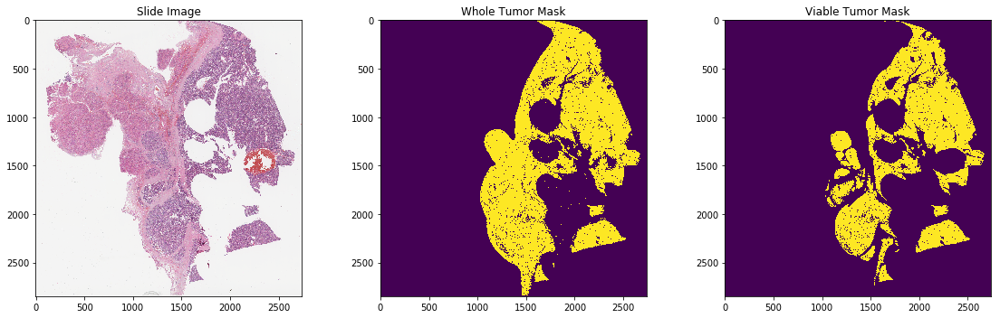

002
Info for sample data #002/50
WSI info:
  Level count: 3
  Level dimensions: ((63743, 45563), (15935, 11390), (3983, 2847))
  Level downsamples: (1.0, 4.00022582688176, 16.00381486085798)
  Dimensions: (63743, 45563)
Objective power: 20
Masks info:
  Dimensions: (45563, 63743)
(2847, 3983, 3)
wsi shape: (2847, 3983, 3), viable mask shape: (2847, 3983), whole mask shape: (2847, 3983)


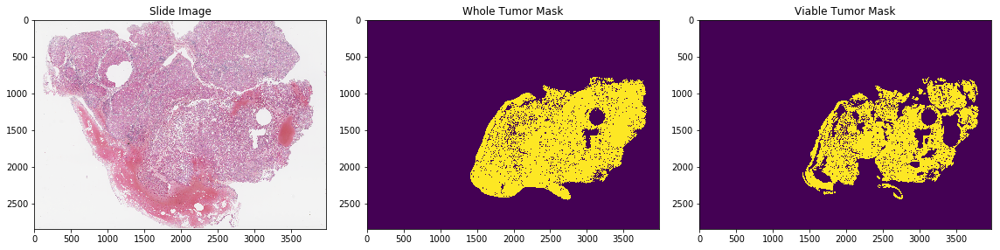

003
Info for sample data #003/50
WSI info:
  Level count: 3
  Level dimensions: ((47807, 39864), (11951, 9966), (2987, 2491))
  Level downsamples: (1.0, 4.000125512509413, 16.00411666129301)
  Dimensions: (47807, 39864)
Objective power: 20
Masks info:
  Dimensions: (39864, 47807)
(2491, 2987, 3)
wsi shape: (2491, 2987, 3), viable mask shape: (2491, 2987), whole mask shape: (2491, 2987)


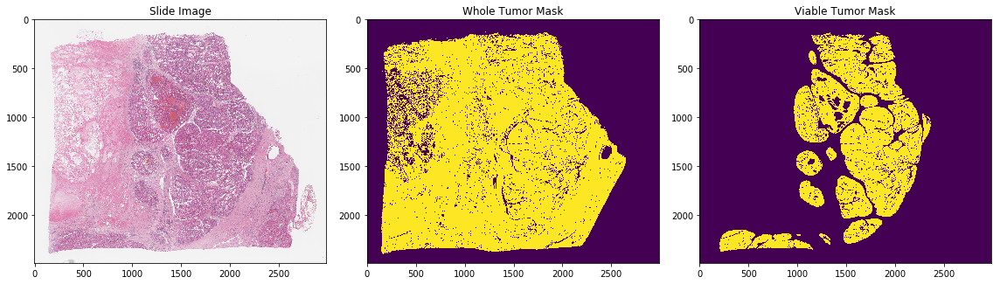

004
Info for sample data #004/50
WSI info:
  Level count: 3
  Level dimensions: ((53757, 43941), (13439, 10985), (3359, 2746))
  Level downsamples: (1.0, 4.000082721762757, 16.002845514881372)
  Dimensions: (53757, 43941)
Objective power: 20
Masks info:
  Dimensions: (43941, 53757)
(2746, 3359, 3)
wsi shape: (2746, 3359, 3), viable mask shape: (2746, 3359), whole mask shape: (2746, 3359)


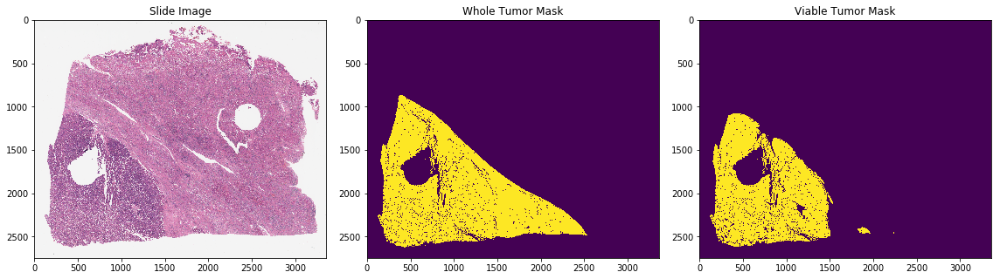

005
Info for sample data #005/50
WSI info:
  Level count: 3
  Level dimensions: ((49799, 36232), (12449, 9058), (3112, 2264))
  Level downsamples: (1.0, 4.000120491605752, 16.002891463115535)
  Dimensions: (49799, 36232)
Objective power: 20
Masks info:
  Dimensions: (36232, 49799)
(2264, 3112, 3)
wsi shape: (2264, 3112, 3), viable mask shape: (2264, 3112), whole mask shape: (2264, 3112)


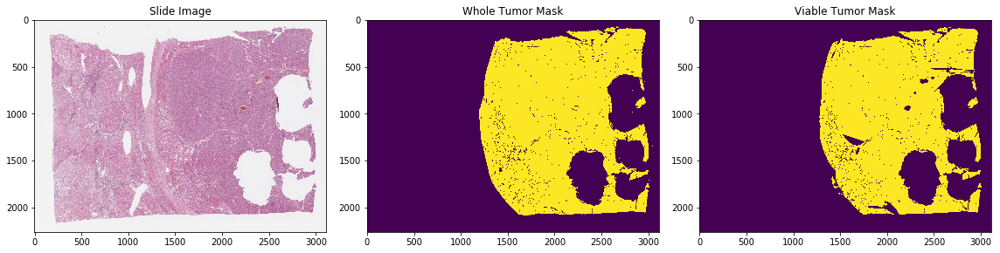

006
Info for sample data #006/50
WSI info:
  Level count: 3
  Level dimensions: ((47784, 37174), (11946, 9293), (2986, 2323))
  Level downsamples: (1.0, 4.000107607876897, 16.00263101821991)
  Dimensions: (47784, 37174)
Objective power: 20
Masks info:
  Dimensions: (37174, 47784)
(2323, 2986, 3)
wsi shape: (2323, 2986, 3), viable mask shape: (2323, 2986), whole mask shape: (2323, 2986)


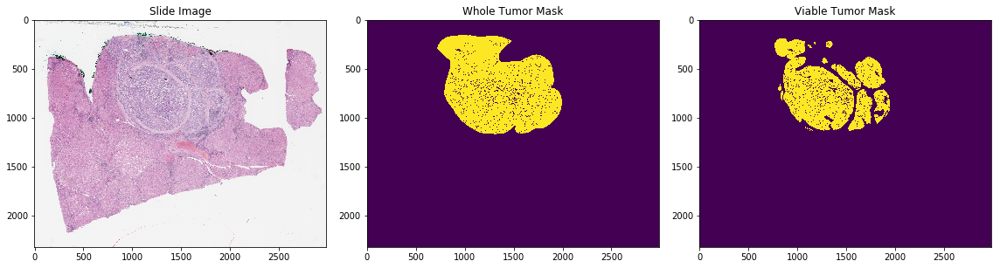

007
Info for sample data #007/50
WSI info:
  Level count: 3
  Level dimensions: ((53973, 45202), (13493, 11300), (3373, 2825))
  Level downsamples: (1.0, 4.000125551826611, 16.00109516225938)
  Dimensions: (53973, 45202)
Objective power: 20
Masks info:
  Dimensions: (45202, 53973)
(2825, 3373, 3)
wsi shape: (2825, 3373, 3), viable mask shape: (2825, 3373), whole mask shape: (2825, 3373)


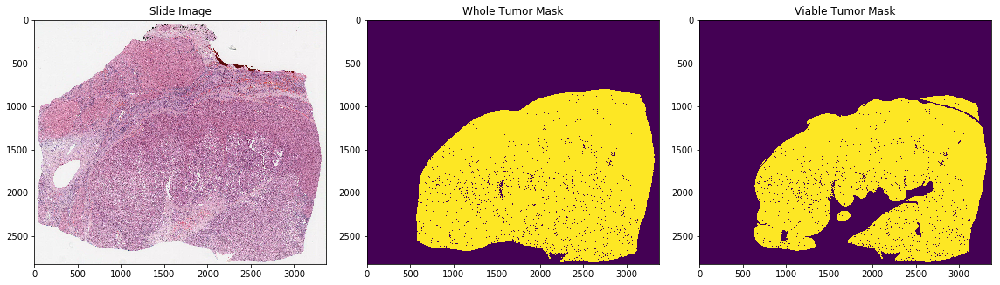

008
Info for sample data #008/50
WSI info:
  Level count: 3
  Level dimensions: ((43179, 35494), (10794, 8873), (2698, 2218))
  Level downsamples: (1.0, 4.000251667546122, 16.00339111695468)
  Dimensions: (43179, 35494)
Objective power: 20
Masks info:
  Dimensions: (35494, 43179)
(2218, 2698, 3)
wsi shape: (2218, 2698, 3), viable mask shape: (2218, 2698), whole mask shape: (2218, 2698)


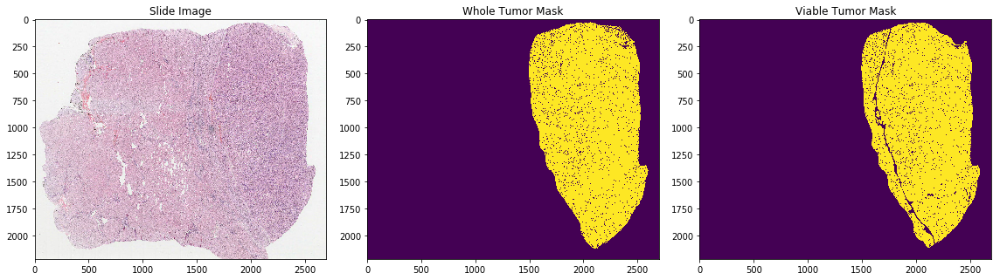

009
Info for sample data #009/50
WSI info:
  Level count: 3
  Level dimensions: ((61170, 41053), (15292, 10263), (3823, 2565))
  Level downsamples: (1.0, 4.000114112368129, 16.00279568774)
  Dimensions: (61170, 41053)
Objective power: 20
Masks info:
  Dimensions: (41053, 61170)
(2565, 3823, 3)
wsi shape: (2565, 3823, 3), viable mask shape: (2565, 3823), whole mask shape: (2565, 3823)


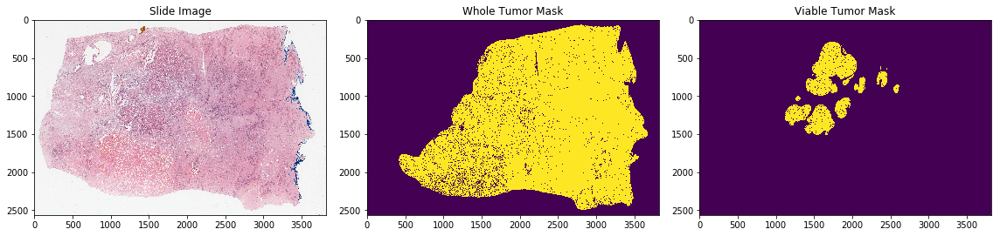

010
Info for sample data #010/50
WSI info:
  Level count: 3
  Level dimensions: ((53783, 33921), (13445, 8480), (3361, 2120))
  Level downsamples: (1.0, 4.000170527901934, 16.00127720579567)
  Dimensions: (53783, 33921)
Objective power: 20
Masks info:
  Dimensions: (33921, 53783)
(2120, 3361, 3)
wsi shape: (2120, 3361, 3), viable mask shape: (2120, 3361), whole mask shape: (2120, 3361)


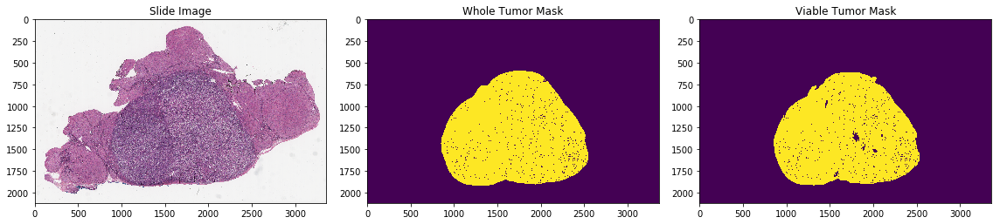

011
Info for sample data #011/50
WSI info:
  Level count: 3
  Level dimensions: ((61721, 42642), (15430, 10660), (3857, 2665))
  Level downsamples: (1.0, 4.000126213037394, 16.00154194439972)
  Dimensions: (61721, 42642)
Objective power: 20
Masks info:
  Dimensions: (42642, 61721)
(2665, 3857, 3)
wsi shape: (2665, 3857, 3), viable mask shape: (2665, 3857), whole mask shape: (2665, 3857)


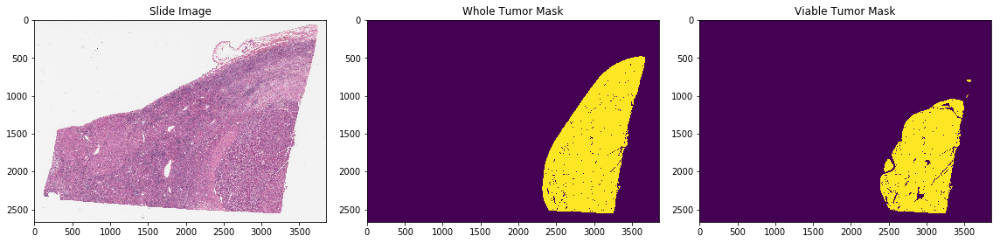

012
Info for sample data #012/50
WSI info:
  Level count: 3
  Level dimensions: ((45815, 39864), (11453, 9966), (2863, 2491))
  Level downsamples: (1.0, 4.000130970051515, 16.00282827469845)
  Dimensions: (45815, 39864)
Objective power: 20
Masks info:
  Dimensions: (39864, 45815)
(2491, 2863, 3)
wsi shape: (2491, 2863, 3), viable mask shape: (2491, 2863), whole mask shape: (2491, 2863)


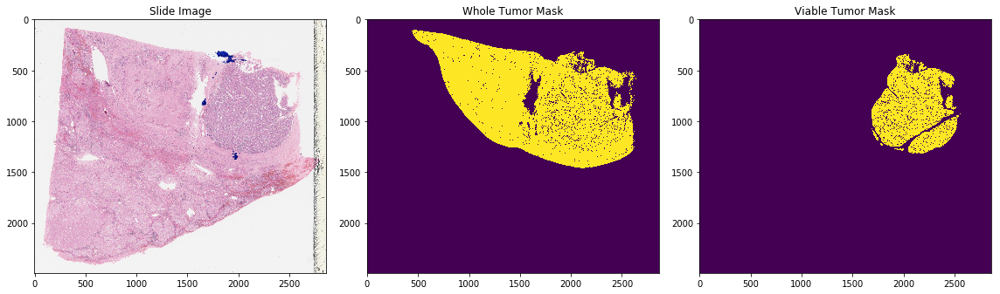

013
Info for sample data #013/50
WSI info:
  Level count: 3
  Level dimensions: ((55776, 47738), (13944, 11934), (3486, 2983))
  Level downsamples: (1.0, 4.000083794201441, 16.00167616493463)
  Dimensions: (55776, 47738)
Objective power: 20
Masks info:
  Dimensions: (47738, 55776)
(2983, 3486, 3)
wsi shape: (2983, 3486, 3), viable mask shape: (2983, 3486), whole mask shape: (2983, 3486)


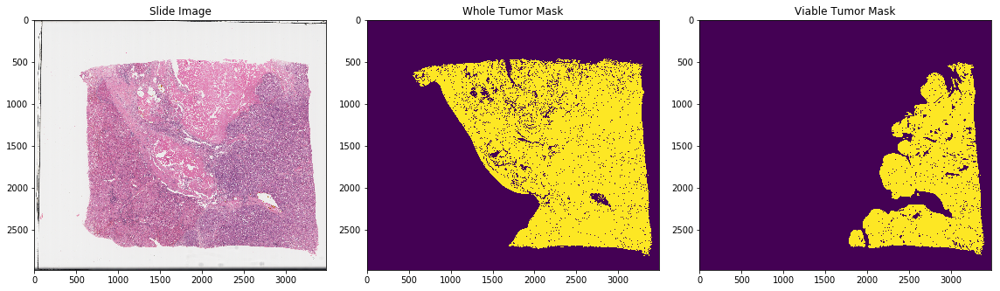

014
Info for sample data #014/50
WSI info:
  Level count: 3
  Level dimensions: ((55775, 45562), (13943, 11390), (3485, 2847))
  Level downsamples: (1.0, 4.000195377177505, 16.00390831497728)
  Dimensions: (55775, 45562)
Objective power: 20
Masks info:
  Dimensions: (45562, 55775)
(2847, 3485, 3)
wsi shape: (2847, 3485, 3), viable mask shape: (2847, 3485), whole mask shape: (2847, 3485)


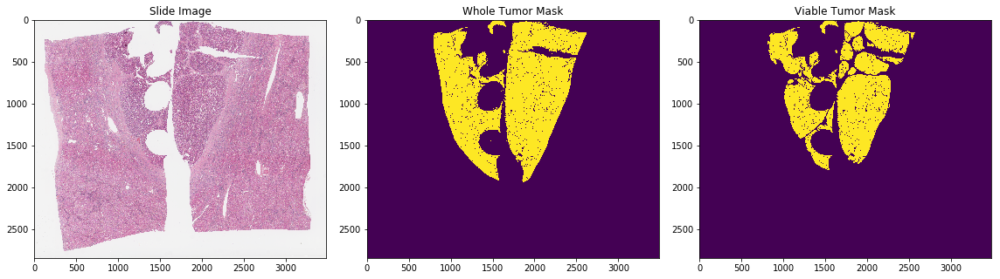

015
Info for sample data #015/50
WSI info:
  Level count: 3
  Level dimensions: ((49799, 45396), (12449, 11349), (3112, 2837))
  Level downsamples: (1.0, 4.000120491605752, 16.001829648702014)
  Dimensions: (49799, 45396)
Objective power: 20
Masks info:
  Dimensions: (45396, 49799)
(2837, 3112, 3)
wsi shape: (2837, 3112, 3), viable mask shape: (2837, 3112), whole mask shape: (2837, 3112)


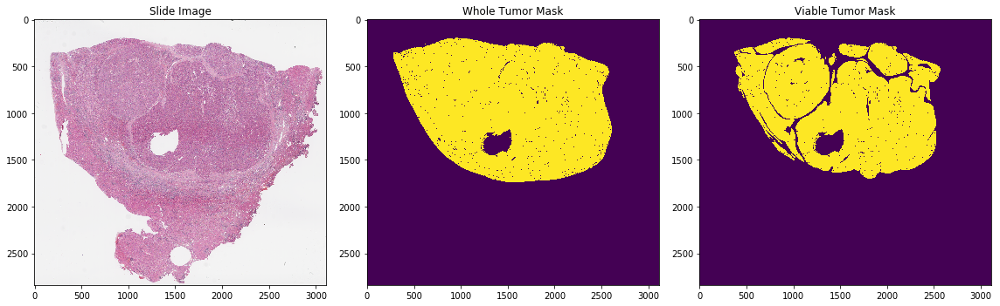

016
Info for sample data #016/50
WSI info:
  Level count: 4
  Level dimensions: ((67727, 35492), (16931, 8873), (4232, 2218), (2116, 1109))
  Level downsamples: (1.0, 4.000088594885122, 16.00267392497541, 32.00534784995082)
  Dimensions: (67727, 35492)
Objective power: 20
Masks info:
  Dimensions: (35492, 67727)
(2218, 4232, 3)
wsi shape: (2218, 4232, 3), viable mask shape: (2218, 4232), whole mask shape: (2218, 4232)


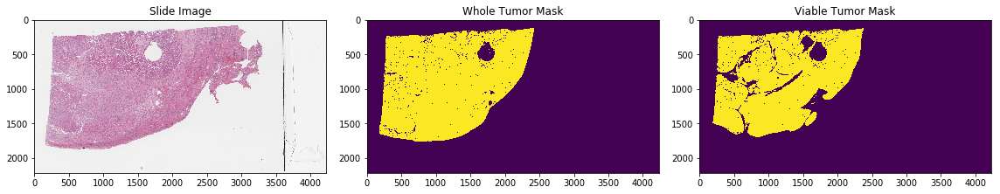

017
Info for sample data #017/50
WSI info:
  Level count: 3
  Level dimensions: ((45815, 40442), (11453, 10110), (2863, 2527))
  Level downsamples: (1.0, 4.000229882019863, 16.003201124675023)
  Dimensions: (45815, 40442)
Objective power: 20
Masks info:
  Dimensions: (40442, 45815)
(2527, 2863, 3)
wsi shape: (2527, 2863, 3), viable mask shape: (2527, 2863), whole mask shape: (2527, 2863)


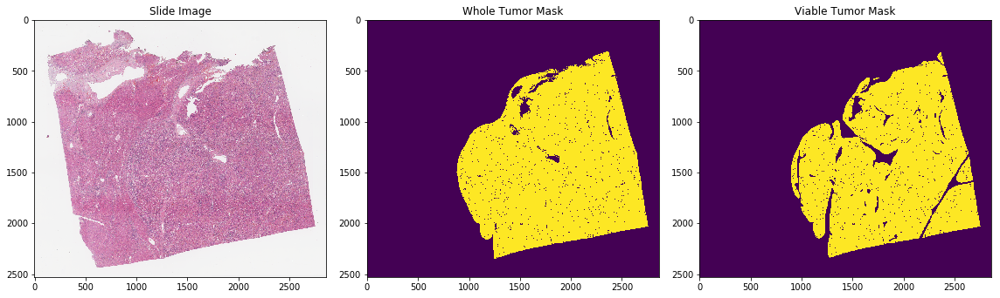

018
Info for sample data #018/50
WSI info:
  Level count: 3
  Level dimensions: ((45815, 39451), (11453, 9862), (2863, 2465))
  Level downsamples: (1.0, 4.000283069017242, 16.003453731210044)
  Dimensions: (45815, 39451)
Objective power: 20
Masks info:
  Dimensions: (39451, 45815)
(2465, 2863, 3)
wsi shape: (2465, 2863, 3), viable mask shape: (2465, 2863), whole mask shape: (2465, 2863)


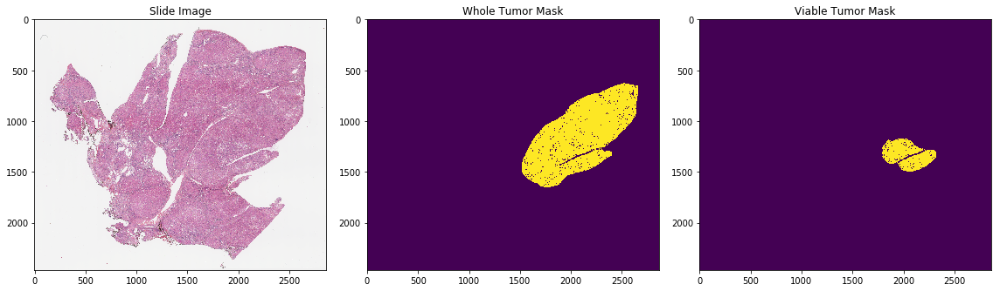

019
Info for sample data #019/50
WSI info:
  Level count: 3
  Level dimensions: ((55775, 41517), (13943, 10379), (3485, 2594))
  Level downsamples: (1.0, 4.00015575506285, 16.004657862919508)
  Dimensions: (55775, 41517)
Objective power: 20
Masks info:
  Dimensions: (41517, 55775)
(2594, 3485, 3)
wsi shape: (2594, 3485, 3), viable mask shape: (2594, 3485), whole mask shape: (2594, 3485)


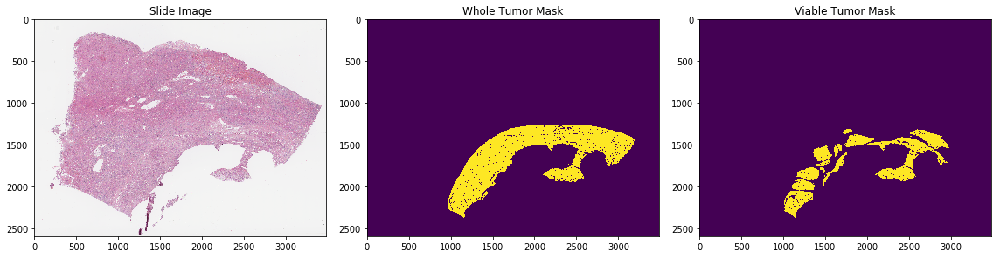

020
Info for sample data #020/50
WSI info:
  Level count: 3
  Level dimensions: ((55775, 45562), (13943, 11390), (3485, 2847))
  Level downsamples: (1.0, 4.000195377177505, 16.00390831497728)
  Dimensions: (55775, 45562)
Objective power: 20
Masks info:
  Dimensions: (45562, 55775)
(2847, 3485, 3)
wsi shape: (2847, 3485, 3), viable mask shape: (2847, 3485), whole mask shape: (2847, 3485)


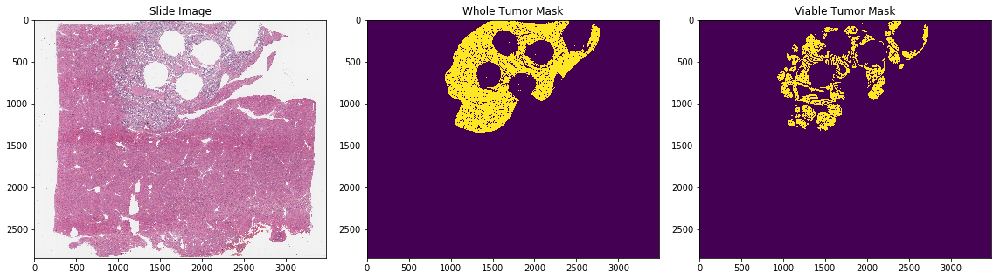

021
Info for sample data #021/50
WSI info:
  Level count: 3
  Level dimensions: ((43823, 41185), (10955, 10296), (2738, 2574))
  Level downsamples: (1.0, 4.000185486327659, 16.00293347590645)
  Dimensions: (43823, 41185)
Objective power: 20
Masks info:
  Dimensions: (41185, 43823)
(2574, 2738, 3)
wsi shape: (2574, 2738, 3), viable mask shape: (2574, 2738), whole mask shape: (2574, 2738)


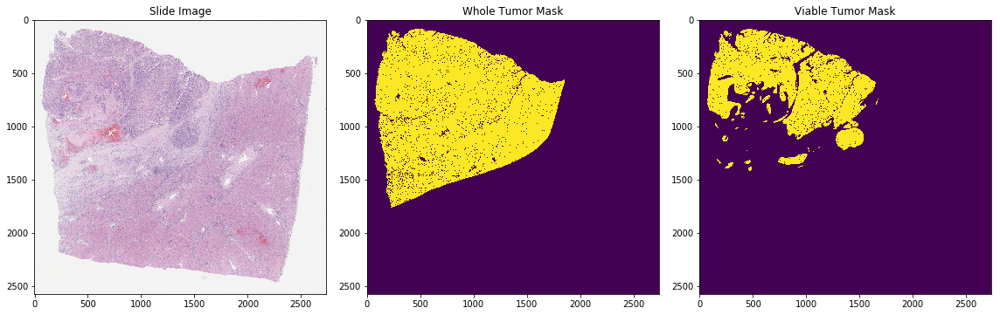

022
Info for sample data #022/50
WSI info:
  Level count: 3
  Level dimensions: ((51792, 46989), (12948, 11747), (3237, 2936))
  Level downsamples: (1.0, 4.000042564058909, 16.002213896457768)
  Dimensions: (51792, 46989)
Objective power: 20
Masks info:
  Dimensions: (46989, 51792)
(2936, 3237, 3)
wsi shape: (2936, 3237, 3), viable mask shape: (2936, 3237), whole mask shape: (2936, 3237)


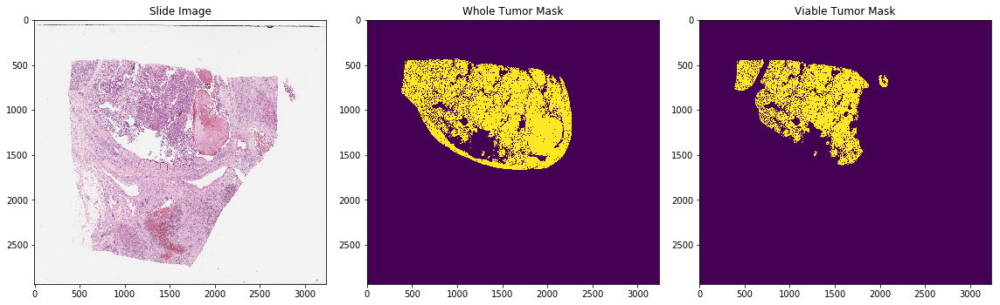

023
Info for sample data #023/50
WSI info:
  Level count: 3
  Level dimensions: ((57767, 34087), (14441, 8521), (3610, 2130))
  Level downsamples: (1.0, 4.00027990659963, 16.00261272157414)
  Dimensions: (57767, 34087)
Objective power: 20
Masks info:
  Dimensions: (34087, 57767)
(2130, 3610, 3)
wsi shape: (2130, 3610, 3), viable mask shape: (2130, 3610), whole mask shape: (2130, 3610)


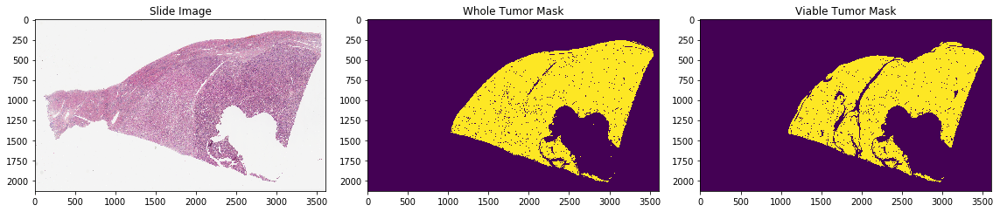

024
Info for sample data #024/50
WSI info:
  Level count: 3
  Level dimensions: ((59760, 47339), (14940, 11834), (3735, 2958))
  Level downsamples: (1.0, 4.000126753422343, 16.00185936443543)
  Dimensions: (59760, 47339)
Objective power: 20
Masks info:
  Dimensions: (47339, 59760)
(2958, 3735, 3)
wsi shape: (2958, 3735, 3), viable mask shape: (2958, 3735), whole mask shape: (2958, 3735)


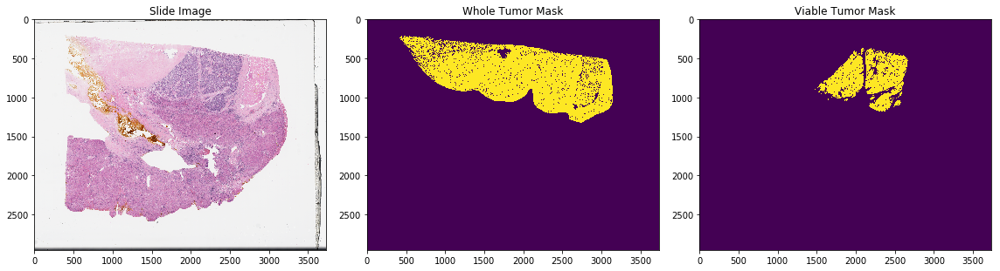

025
Info for sample data #025/50
WSI info:
  Level count: 3
  Level dimensions: ((59759, 42343), (14939, 10585), (3734, 2646))
  Level downsamples: (1.0, 4.000242118294132, 16.003331321220983)
  Dimensions: (59759, 42343)
Objective power: 20
Masks info:
  Dimensions: (42343, 59759)
(2646, 3734, 3)
wsi shape: (2646, 3734, 3), viable mask shape: (2646, 3734), whole mask shape: (2646, 3734)


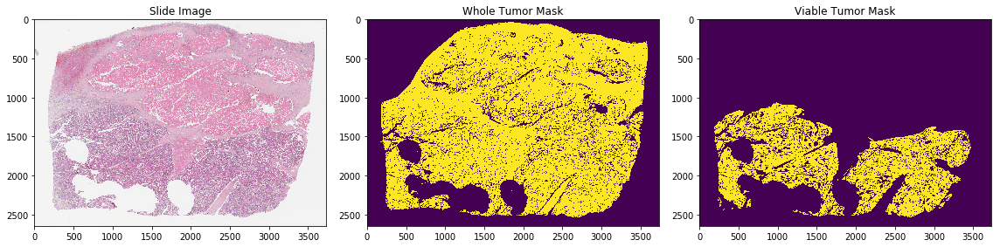

026
Info for sample data #026/50
WSI info:
  Level count: 3
  Level dimensions: ((49799, 39535), (12449, 9883), (3112, 2470))
  Level downsamples: (1.0, 4.000272267382337, 16.0041611159102)
  Dimensions: (49799, 39535)
Objective power: 20
Masks info:
  Dimensions: (39535, 49799)
(2470, 3112, 3)
wsi shape: (2470, 3112, 3), viable mask shape: (2470, 3112), whole mask shape: (2470, 3112)


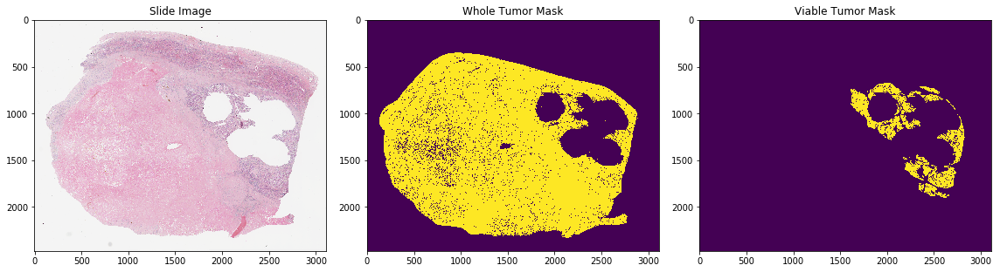

027
Info for sample data #027/50
WSI info:
  Level count: 3
  Level dimensions: ((51791, 45562), (12947, 11390), (3236, 2847))
  Level downsamples: (1.0, 4.000203653267834, 16.004073910776334)
  Dimensions: (51791, 45562)
Objective power: 20
Masks info:
  Dimensions: (45562, 51791)
(2847, 3236, 3)
wsi shape: (2847, 3236, 3), viable mask shape: (2847, 3236), whole mask shape: (2847, 3236)


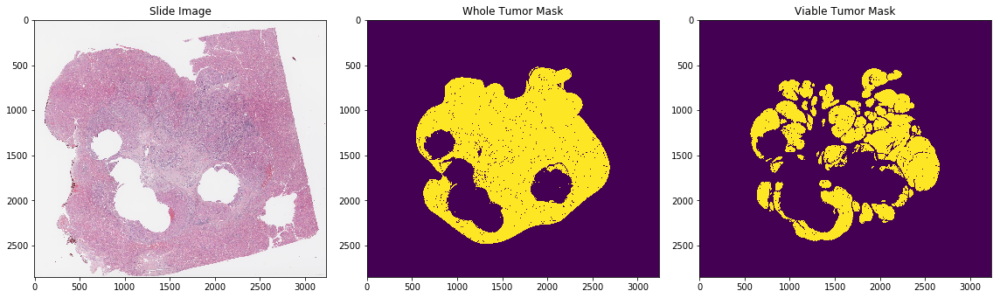

028
Info for sample data #028/50
WSI info:
  Level count: 3
  Level dimensions: ((63743, 42096), (15935, 10524), (3983, 2631))
  Level downsamples: (1.0, 4.0000941324129276, 16.001883002761737)
  Dimensions: (63743, 42096)
Objective power: 20
Masks info:
  Dimensions: (42096, 63743)
(2631, 3983, 3)
wsi shape: (2631, 3983, 3), viable mask shape: (2631, 3983), whole mask shape: (2631, 3983)


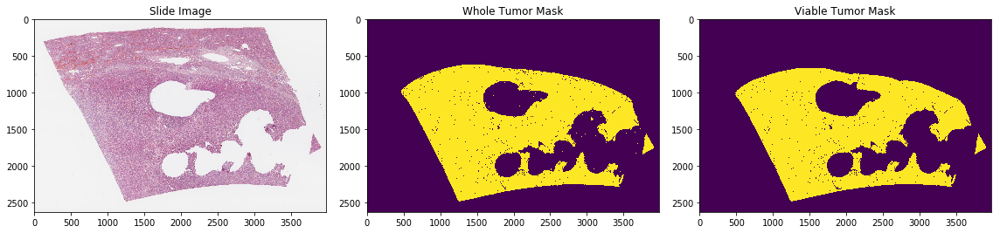

029
Info for sample data #029/50
WSI info:
  Level count: 3
  Level dimensions: ((53783, 45562), (13445, 11390), (3361, 2847))
  Level downsamples: (1.0, 4.000199361950338, 16.002797591372012)
  Dimensions: (53783, 45562)
Objective power: 20
Masks info:
  Dimensions: (45562, 53783)
(2847, 3361, 3)
wsi shape: (2847, 3361, 3), viable mask shape: (2847, 3361), whole mask shape: (2847, 3361)


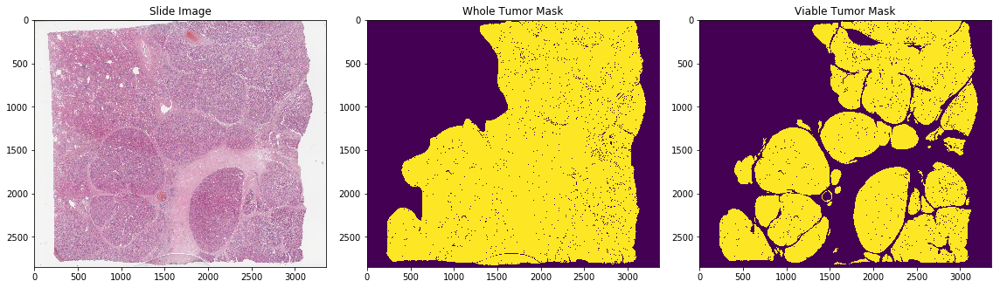

030
Info for sample data #030/50
WSI info:
  Level count: 3
  Level dimensions: ((57767, 45562), (14441, 11390), (3610, 2847))
  Level downsamples: (1.0, 4.000191667235621, 16.00272576371882)
  Dimensions: (57767, 45562)
Objective power: 20
Masks info:
  Dimensions: (45562, 57767)
(2847, 3610, 3)
wsi shape: (2847, 3610, 3), viable mask shape: (2847, 3610), whole mask shape: (2847, 3610)


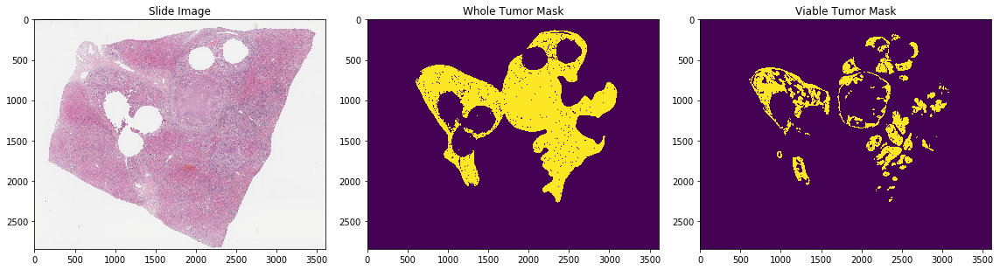

031
Info for sample data #031/50
WSI info:
  Level count: 3
  Level dimensions: ((51791, 44406), (12947, 11101), (3236, 2775))
  Level downsamples: (1.0, 4.000205938929876, 16.003398757224467)
  Dimensions: (51791, 44406)
Objective power: 20
Masks info:
  Dimensions: (44406, 51791)
(2775, 3236, 3)
wsi shape: (2775, 3236, 3), viable mask shape: (2775, 3236), whole mask shape: (2775, 3236)


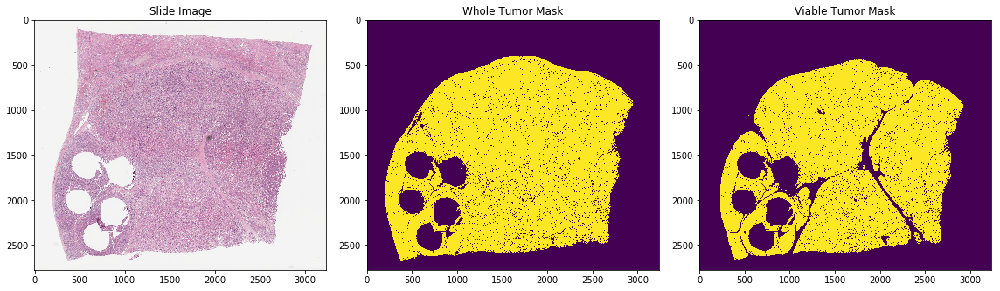

032
Info for sample data #032/50
WSI info:
  Level count: 3
  Level dimensions: ((57767, 44572), (14441, 11143), (3610, 2785))
  Level downsamples: (1.0, 4.000103870923066, 16.003123927649607)
  Dimensions: (57767, 44572)
Objective power: 20
Masks info:
  Dimensions: (44572, 57767)
(2785, 3610, 3)
wsi shape: (2785, 3610, 3), viable mask shape: (2785, 3610), whole mask shape: (2785, 3610)


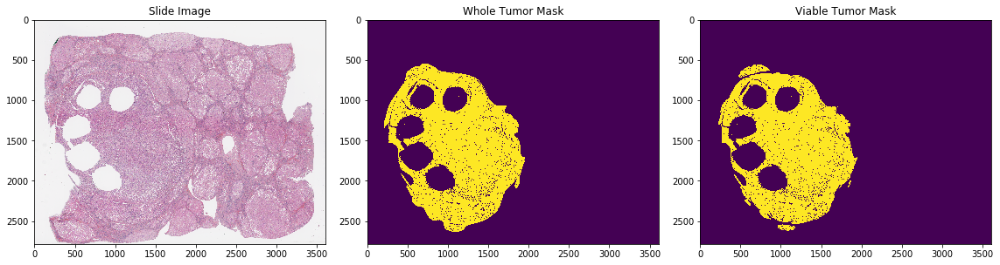

033
Info for sample data #033/50
WSI info:
  Level count: 3
  Level dimensions: ((35855, 39037), (8963, 9759), (2240, 2439))
  Level downsamples: (1.0, 4.000218589438012, 16.006013240935978)
  Dimensions: (35855, 39037)
Objective power: 20
Masks info:
  Dimensions: (39037, 35855)
(2439, 2240, 3)
wsi shape: (2439, 2240, 3), viable mask shape: (2439, 2240), whole mask shape: (2439, 2240)


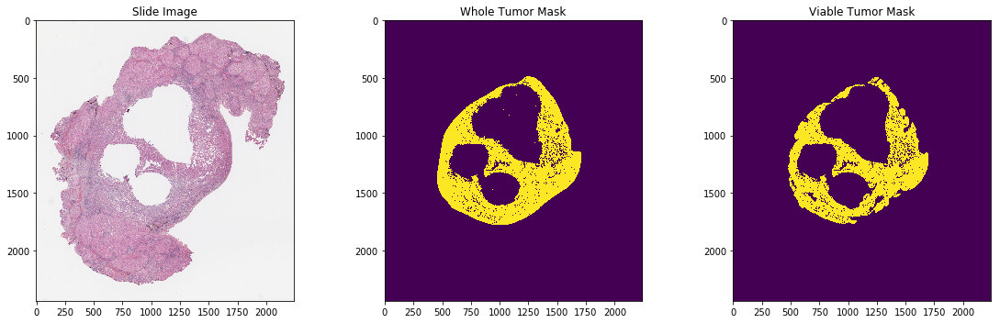

034
Info for sample data #034/50
WSI info:
  Level count: 3
  Level dimensions: ((37847, 41019), (9461, 10254), (2365, 2563))
  Level downsamples: (1.0, 4.000304829985115, 16.003625838180184)
  Dimensions: (37847, 41019)
Objective power: 20
Masks info:
  Dimensions: (41019, 37847)
(2563, 2365, 3)
wsi shape: (2563, 2365, 3), viable mask shape: (2563, 2365), whole mask shape: (2563, 2365)


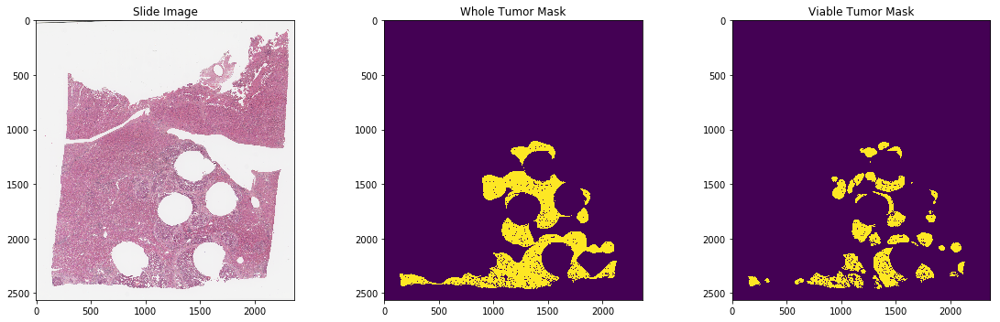

035
Info for sample data #035/50
WSI info:
  Level count: 3
  Level dimensions: ((57767, 45562), (14441, 11390), (3610, 2847))
  Level downsamples: (1.0, 4.000191667235621, 16.00272576371882)
  Dimensions: (57767, 45562)
Objective power: 20
Masks info:
  Dimensions: (45562, 57767)
(2847, 3610, 3)
wsi shape: (2847, 3610, 3), viable mask shape: (2847, 3610), whole mask shape: (2847, 3610)


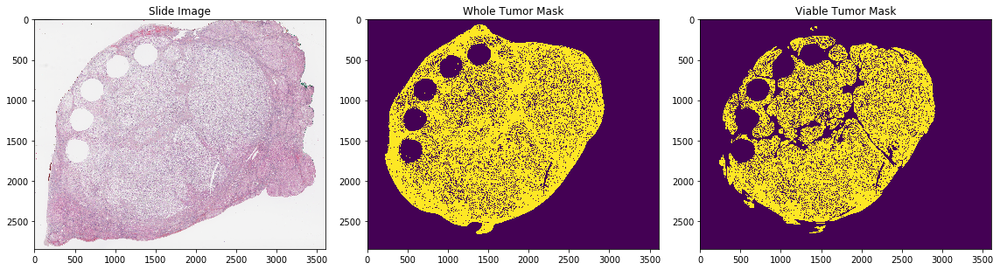

036
Info for sample data #036/50
WSI info:
  Level count: 3
  Level dimensions: ((49799, 46882), (12449, 11720), (3112, 2930))
  Level downsamples: (1.0, 4.000205815837834, 16.001465975591564)
  Dimensions: (49799, 46882)
Objective power: 20
Masks info:
  Dimensions: (46882, 49799)
(2930, 3112, 3)
wsi shape: (2930, 3112, 3), viable mask shape: (2930, 3112), whole mask shape: (2930, 3112)


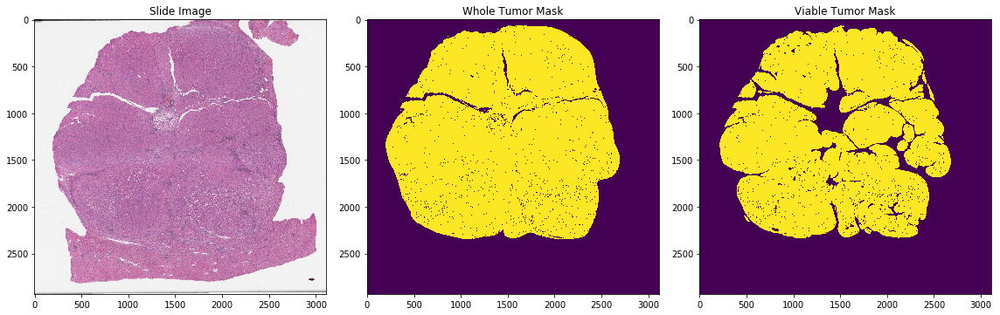

037
Info for sample data #037/50
WSI info:
  Level count: 4
  Level dimensions: ((67727, 40032), (16931, 10008), (4232, 2502), (2116, 1251))
  Level downsamples: (1.0, 4.000088594885122, 16.001772211720226, 32.00354442344045)
  Dimensions: (67727, 40032)
Objective power: 20
Masks info:
  Dimensions: (40032, 67727)
(2502, 4232, 3)
wsi shape: (2502, 4232, 3), viable mask shape: (2502, 4232), whole mask shape: (2502, 4232)


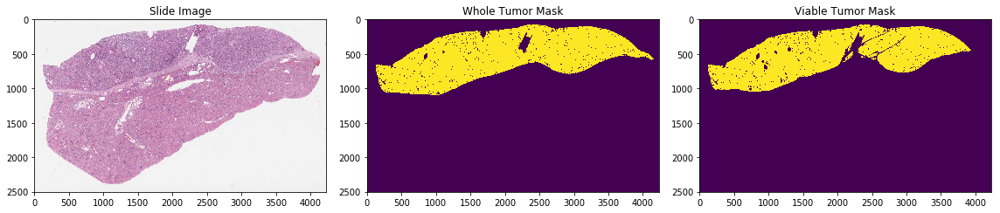

038
Info for sample data #038/50
WSI info:
  Level count: 3
  Level dimensions: ((49775, 45155), (12443, 11288), (3110, 2822))
  Level downsamples: (1.0, 4.000253434185755, 16.00294311347907)
  Dimensions: (49775, 45155)
Objective power: 20
Masks info:
  Dimensions: (45155, 49775)
(2822, 3110, 3)
wsi shape: (2822, 3110, 3), viable mask shape: (2822, 3110), whole mask shape: (2822, 3110)


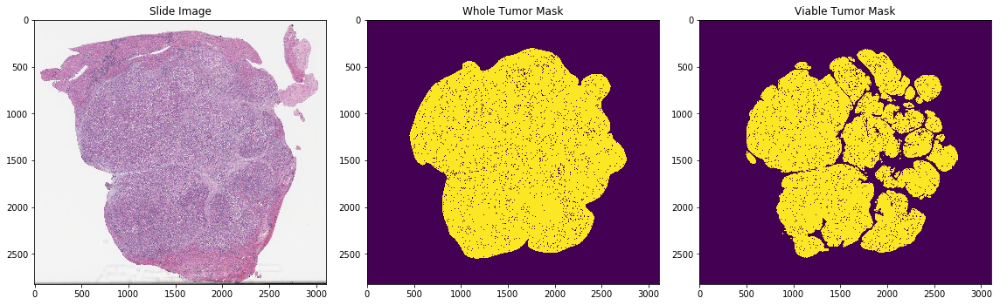

039
Info for sample data #039/50
WSI info:
  Level count: 3
  Level dimensions: ((51791, 46057), (12947, 11514), (3236, 2878))
  Level downsamples: (1.0, 4.000159282350451, 16.003881261966875)
  Dimensions: (51791, 46057)
Objective power: 20
Masks info:
  Dimensions: (46057, 51791)
(2878, 3236, 3)
wsi shape: (2878, 3236, 3), viable mask shape: (2878, 3236), whole mask shape: (2878, 3236)


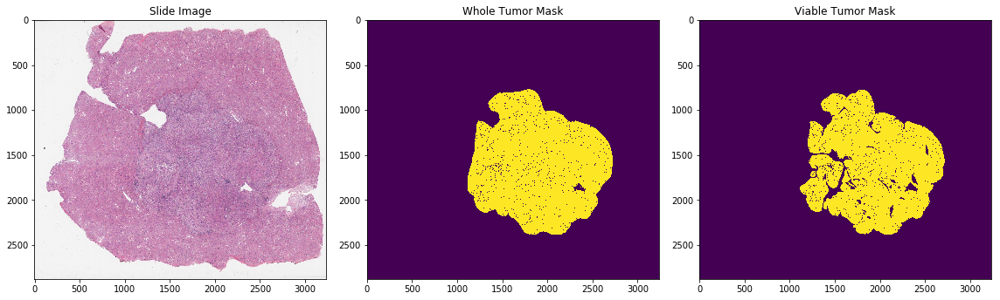

040
Info for sample data #040/50
WSI info:
  Level count: 4
  Level dimensions: ((55772, 51806), (13943, 12951), (3485, 3237), (1742, 1618))
  Level downsamples: (1.0, 4.00007721411474, 16.003884160413868, 32.01730744395357)
  Dimensions: (55772, 51806)
Objective power: 20
Masks info:
  Dimensions: (51806, 55772)
(3237, 3485, 3)
wsi shape: (3237, 3485, 3), viable mask shape: (3237, 3485), whole mask shape: (3237, 3485)


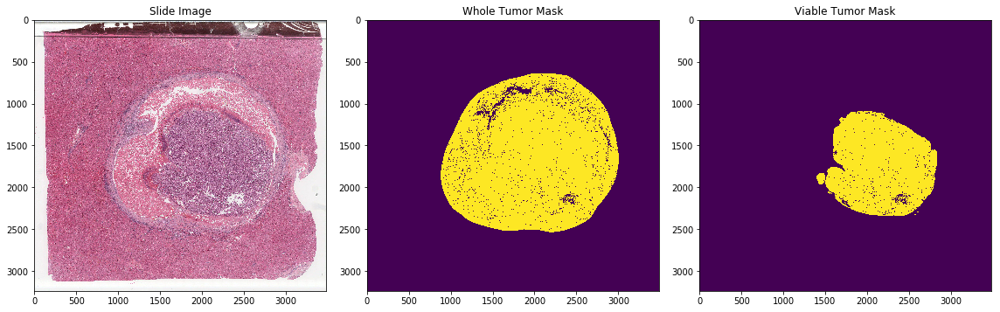

041
Info for sample data #041/50
WSI info:
  Level count: 3
  Level dimensions: ((55772, 42092), (13943, 10523), (3485, 2630))
  Level downsamples: (1.0, 4.0, 16.004003033096758)
  Dimensions: (55772, 42092)
Objective power: 20
Masks info:
  Dimensions: (42092, 55772)
(2630, 3485, 3)
wsi shape: (2630, 3485, 3), viable mask shape: (2630, 3485), whole mask shape: (2630, 3485)


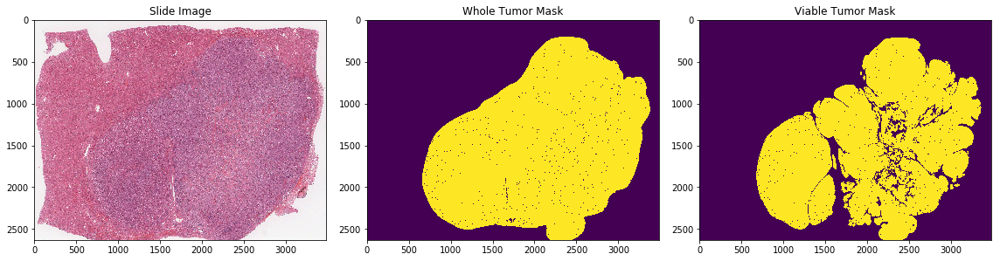

042
Info for sample data #042/50
WSI info:
  Level count: 3
  Level dimensions: ((59759, 45563), (14939, 11390), (3734, 2847))
  Level downsamples: (1.0, 4.00023210279603, 16.003940427994472)
  Dimensions: (59759, 45563)
Objective power: 20
Masks info:
  Dimensions: (45563, 59759)
(2847, 3734, 3)
wsi shape: (2847, 3734, 3), viable mask shape: (2847, 3734), whole mask shape: (2847, 3734)


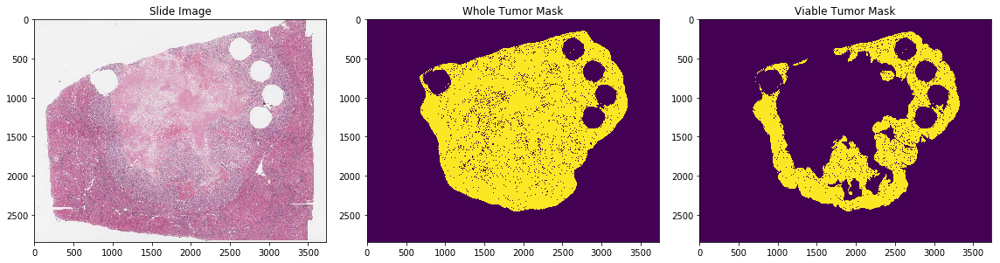

043
Info for sample data #043/50
WSI info:
  Level count: 3
  Level dimensions: ((57768, 43917), (14442, 10979), (3610, 2744))
  Level downsamples: (1.0, 4.000045541488296, 16.003476837905723)
  Dimensions: (57768, 43917)
Objective power: 20
Masks info:
  Dimensions: (43917, 57768)
(2744, 3610, 3)
wsi shape: (2744, 3610, 3), viable mask shape: (2744, 3610), whole mask shape: (2744, 3610)


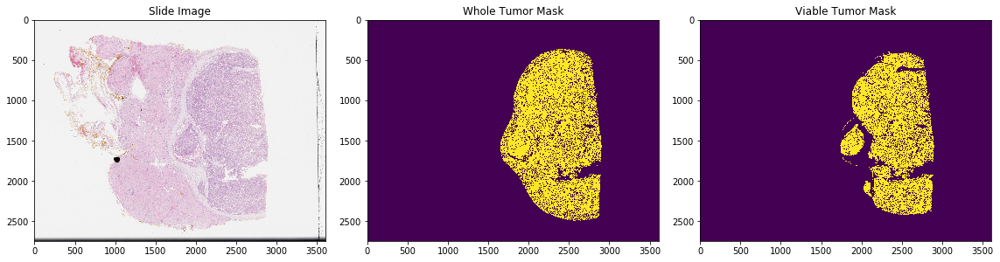

044
Info for sample data #044/50
WSI info:
  Level count: 3
  Level dimensions: ((57768, 47741), (14442, 11935), (3610, 2983))
  Level downsamples: (1.0, 4.00004189359028, 16.003287047656016)
  Dimensions: (57768, 47741)
Objective power: 20
Masks info:
  Dimensions: (47741, 57768)
(2983, 3610, 3)
wsi shape: (2983, 3610, 3), viable mask shape: (2983, 3610), whole mask shape: (2983, 3610)


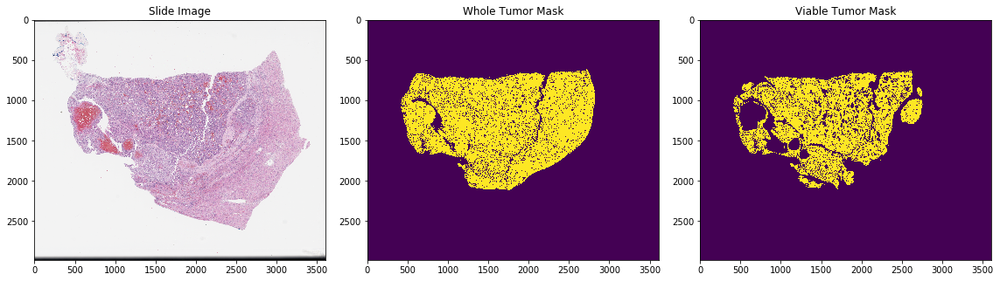

045
Info for sample data #045/50
WSI info:
  Level count: 3
  Level dimensions: ((53784, 47731), (13446, 11932), (3361, 2983))
  Level downsamples: (1.0, 4.000125712370098, 16.001692971467893)
  Dimensions: (53784, 47731)
Objective power: 20
Masks info:
  Dimensions: (47731, 53784)
(2983, 3361, 3)
wsi shape: (2983, 3361, 3), viable mask shape: (2983, 3361), whole mask shape: (2983, 3361)


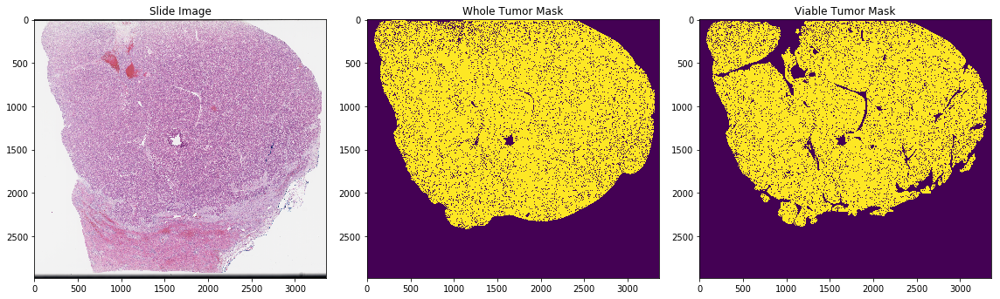

046
Info for sample data #046/50
WSI info:
  Level count: 3
  Level dimensions: ((51792, 47723), (12948, 11930), (3237, 2982))
  Level downsamples: (1.0, 4.000125733445096, 16.001844399731723)
  Dimensions: (51792, 47723)
Objective power: 20
Masks info:
  Dimensions: (47723, 51792)
(2982, 3237, 3)
wsi shape: (2982, 3237, 3), viable mask shape: (2982, 3237), whole mask shape: (2982, 3237)


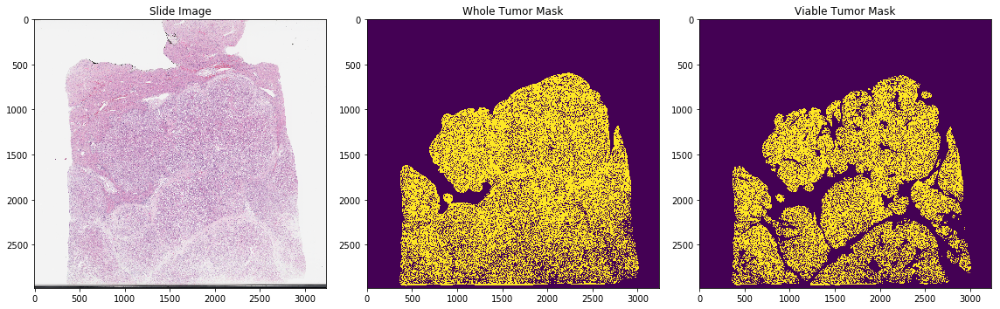

047
Info for sample data #047/50
WSI info:
  Level count: 3
  Level dimensions: ((64768, 47009), (16192, 11752), (4048, 2938))
  Level downsamples: (1.0, 4.000042545949626, 16.000170183798502)
  Dimensions: (64768, 47009)
Objective power: 20
Masks info:
  Dimensions: (47009, 64768)
(2938, 4048, 3)
wsi shape: (2938, 4048, 3), viable mask shape: (2938, 4048), whole mask shape: (2938, 4048)


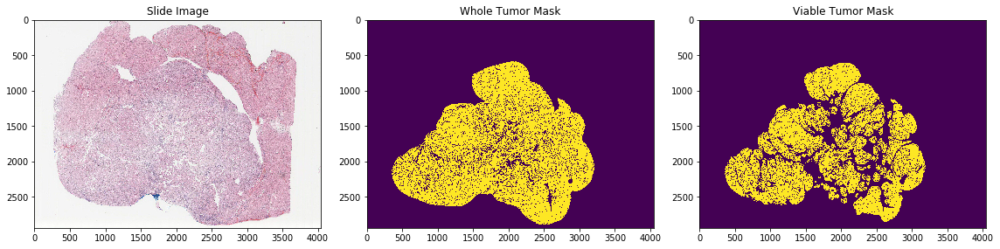

048
Info for sample data #048/50
WSI info:
  Level count: 3
  Level dimensions: ((55775, 33178), (13943, 8294), (3485, 2073))
  Level downsamples: (1.0, 4.000228149951036, 16.004564043682493)
  Dimensions: (55775, 33178)
Objective power: 20
Masks info:
  Dimensions: (33178, 55775)
(2073, 3485, 3)
wsi shape: (2073, 3485, 3), viable mask shape: (2073, 3485), whole mask shape: (2073, 3485)


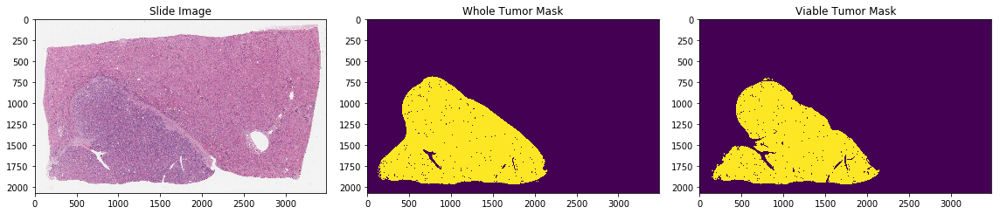

049
Info for sample data #049/50
WSI info:
  Level count: 3
  Level dimensions: ((57767, 44984), (14441, 11246), (3610, 2811))
  Level downsamples: (1.0, 4.000103870923066, 16.002392510231374)
  Dimensions: (57767, 44984)
Objective power: 20
Masks info:
  Dimensions: (44984, 57767)
(2811, 3610, 3)
wsi shape: (2811, 3610, 3), viable mask shape: (2811, 3610), whole mask shape: (2811, 3610)


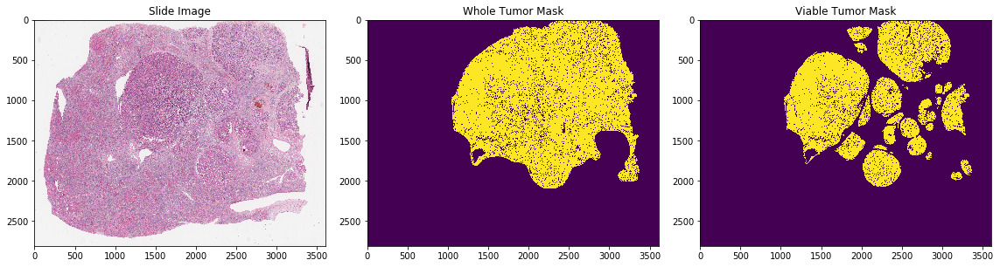

050
Info for sample data #050/50
WSI info:
  Level count: 3
  Level dimensions: ((53783, 42590), (13445, 10647), (3361, 2661))
  Level downsamples: (1.0, 4.00020548880863, 16.003671946742823)
  Dimensions: (53783, 42590)
Objective power: 20
Masks info:
  Dimensions: (42590, 53783)
(2661, 3361, 3)
wsi shape: (2661, 3361, 3), viable mask shape: (2661, 3361), whole mask shape: (2661, 3361)


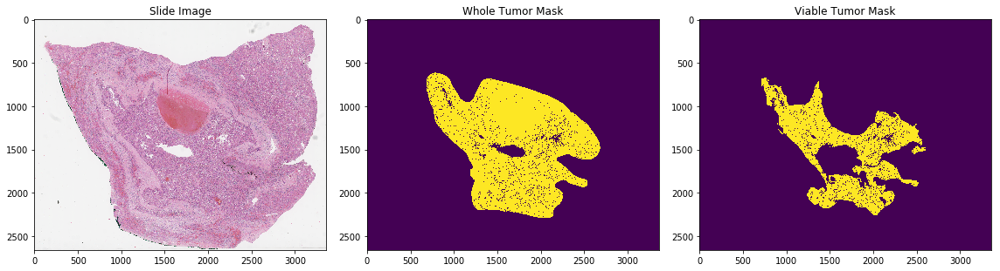

In [23]:
visualize_data("train")

In [ ]:
visualize("val")